In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Importing required libraries

In [2]:
import numpy as np
import pandas as pd

# Libraries used for plots
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.animation import PillowWriter

from IPython.display import Image
import seaborn as sns
import pylab

# PyCBC libraries used to read and manipulate gravitational data
from pycbc.catalog import Merger
from pycbc.frame import read_frame
from astropy.utils.data import download_file
from pycbc.filter import highpass, resample_to_delta_t
from pycbc.psd import interpolate, inverse_spectrum_truncation

# PyCBC libraries that are used for MCMC algorithm
from pycbc.distributions import Uniform, JointDistribution, SinAngle, UniformSky
from pycbc.inference import models, sampler

import copy
import time

PyCBC.libutils: pkg-config call failed, setting NO_PKGCONFIG=1


# Viewing the raw LIGO data

In [3]:
# For Single Template Model

# Storing the file name
gw170817_file_names = {}

# To store Power Spectral Density
psds = {}

# To store data
gw170817 = {}

In [4]:
merger_gw170817 = Merger("GW170817")

# LIGO Observatories
ifos = ['H1', 'V1', 'L1']

for ifo in ifos:
    
    print("Downloading: {} dataset".format(ifo))
    
    # Downloading the gravitational wave data for GW170817
    url = "https://dcc.ligo.org/public/0146/P1700349/001/{}-{}1_LOSC_CLN_4_V1-1187007040-2048.gwf"

    file_name = download_file(url.format(ifo[0], ifo[0]), cache = True)
    
    # Storing the file name
    gw170817_file_names[ifo] = file_name
    
    # Storing the data itself
    gw170817[ifo] = read_frame(file_name, "{}:LOSC-STRAIN".format(ifo), start_time = int(merger_gw170817.time - 260), end_time = int(merger_gw170817.time + 40))

Downloading: H1 dataset
Downloading: V1 dataset
Downloading: L1 dataset


## Plotting Entire 300 seconds of data around GW170817

In [5]:
def plot_gravitational_waves(ifos, gw_merger):
    
    pylab.figure(figsize = (20, 5))

    for ifo in ifos:
        pylab.plot(gw_merger[ifo].sample_times, gw_merger[ifo], label = ifo)

        pylab.ylabel('Strain')
        pylab.xlabel('GPS Time (s)')
        pylab.legend()
        
    pylab.show()

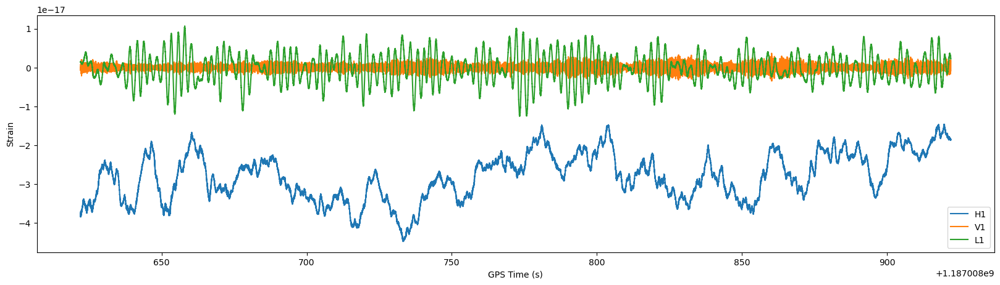

In [6]:
plot_gravitational_waves(ifos, gw170817)

# Removing low frequency content and resampling the data

**We apply highpass filter to the signal at 15Hz.<br>Applying high pass filter is used for removing low frequency content from a signal.**

**Gravitational waves have higher frequencies than most of the noise, so by filtering out low frequencies, we can enhance the signal-to-noise ratio of the gravitational wave.**

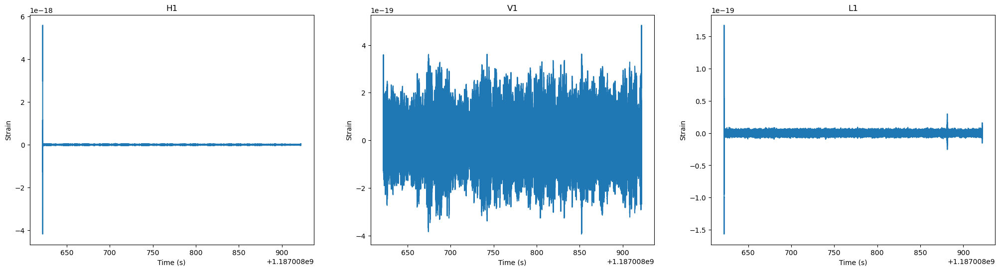

In [7]:
gw170817_highpass_resampled = {}

fig, ax = pylab.subplots(1, 3, figsize = (25, 6))

# Looping through every detector
for i, ifo in zip(range(len(ifos)), ifos):
    
    # Applying HighPass Filter: Frequencies below 15Hz are removed.
    gw170817_highpass = highpass(gw170817[ifo], 15.0)
    
    # Resampling to delta_t: Used to adjust sampling rate of gravitational wave data from each detectors.
        # It makes the data from different detectors have same time step which allows us to compare data between detectors.
    gw170817_highpass_resampled[ifo] = resample_to_delta_t(gw170817_highpass, 1.0/2048)
    
    # Plotting the resampled timeseries
    ax[i].plot(gw170817_highpass_resampled[ifo].sample_times, gw170817_highpass_resampled[ifo])
    ax[i].set_xlabel('Time (s)')
    ax[i].set_title(ifo)
    
    ax[i].set_ylabel('Strain')
    
pylab.show()

**The spike is caused by the high pass and resampling stages filtering of the data.<br>When the filter is applied to boundaries, it wraps around the beginning of the data.<br>Since the data has the discontinuity the filter itself will ring off for a time up to the length of the filter.**

**To avoid it we can crop 2 seconds of data from both the beginning and the end.**

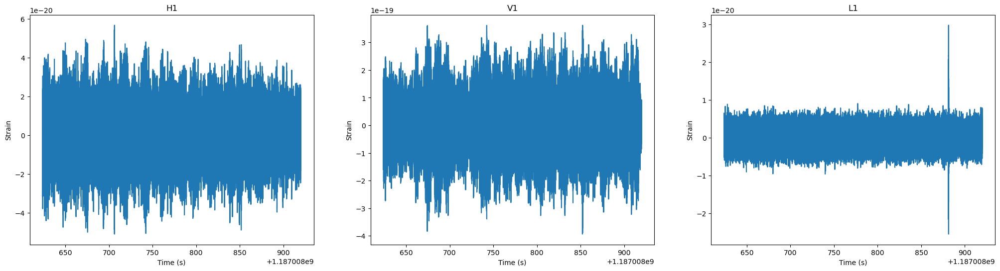

In [8]:
gw170817_highpass_croped = {}

fig, ax = pylab.subplots(1, 3, figsize = (25, 6))

for i, ifo in zip(range(len(ifos)), ifos):
    gw170817_highpass_croped[ifo] = gw170817_highpass_resampled[ifo].crop(2, 2)
    
    ax[i].plot(gw170817_highpass_croped[ifo].sample_times, gw170817_highpass_croped[ifo])
    ax[i].set_xlabel('Time (s)')
    ax[i].set_ylabel('Strain')
    
    ax[i].set_title(ifo)

pylab.show()

# Power Spectral Density

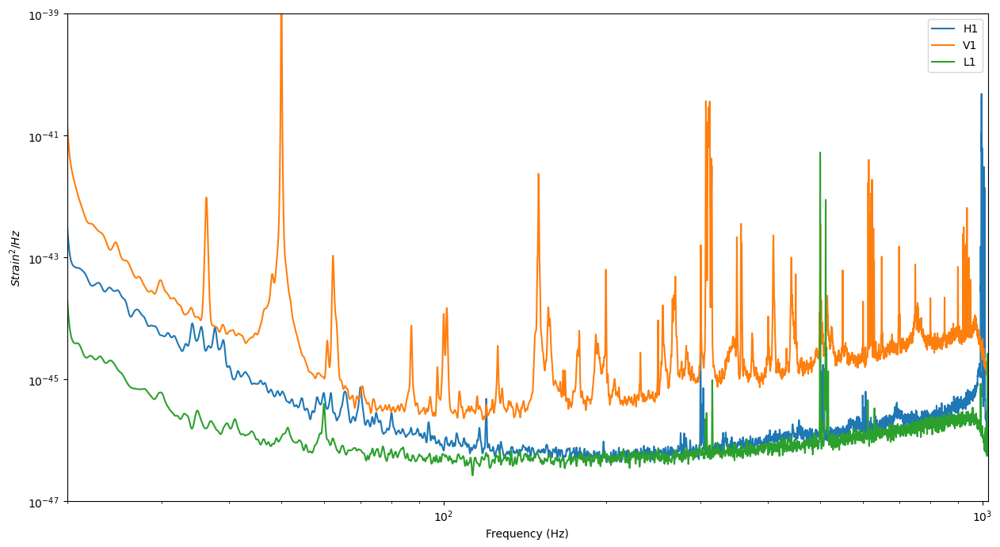

In [9]:
gw170817_interpolate = {}
gw170817_psd = {}

pylab.figure(figsize = (15, 8))

for ifo in ifos:
    
    # Limiting the time around the signal
    gw170817_highpass_resampled[ifo] = gw170817_highpass_resampled[ifo].time_slice(merger_gw170817.time - 112, merger_gw170817.time + 16)
    
    # Convert to a frequency series by taking the data's FFT and storing it in gw170817 series
    gw170817[ifo] = gw170817_highpass_resampled[ifo].to_frequencyseries()
    
    # Interpolate: Process of estimating the a new PSD value at a frequency that is not explicitly included in the original PSD.
    # Offers high resolution (provides more detailed information about the freq content in the signal), reduces noise and statistical fluctutations in the data.
    gw170817_interpolate[ifo] = interpolate(gw170817_highpass_resampled[ifo].psd(4), gw170817_highpass_resampled[ifo].delta_f)
    
    # inverse_spectrum_truncation: It is used to mitigate the effects of non-stationary noise in the data.
    gw170817_psd[ifo] = inverse_spectrum_truncation(gw170817_interpolate[ifo], int(4 * gw170817_interpolate[ifo].sample_rate), trunc_method = "hann", low_frequency_cutoff = 20.0)
    
    # Storing psds for SingleTemplate Model
    psds[ifo] = gw170817_psd[ifo]
    
    pylab.loglog(gw170817_psd[ifo].sample_frequencies, gw170817_psd[ifo], label = ifo)
    pylab.ylabel('$Strain^2 / Hz$')
    pylab.xlabel('Frequency (Hz)')
    
    pylab.ylim(1e-47, 1e-39)
    pylab.xlim(20, 1024)
    
    pylab.legend()

pylab.show()

**Spikes in the above graph indicates the presence of noise at specific frequencies for each detectors.**

**Not all peaks in the above graph are due to noise. Some may due to presence of gravitational waves.**

# Visualizing the Gravitational Wave

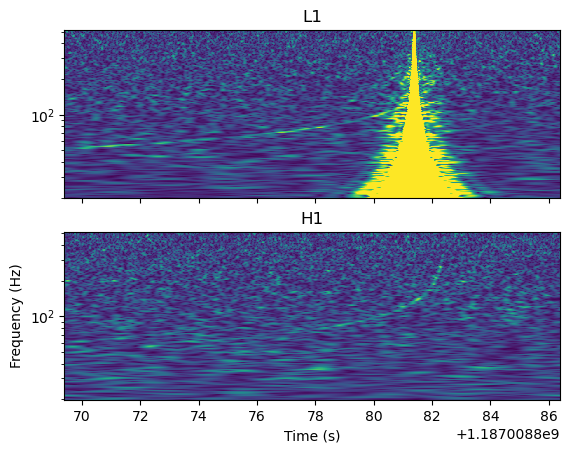

In [10]:
fig_gw170817, axs_gw170817 = plt.subplots(2, 1, sharex=True, sharey=True)

for ifo, ax in zip(["L1", "H1"], axs_gw170817):
    plt.sca(ax)
    plt.title(ifo)
    
    ts = merger_gw170817.strain(ifo).time_slice(merger_gw170817.time - 15, merger_gw170817.time + 6)
    white = ts.whiten(4, 4)

    times, freqs, power = white.qtransform(.01, logfsteps=200,
                                        qrange=(110, 110),
                                        frange=(20, 512))
    
    plt.pcolormesh(times, freqs, power**0.5, vmax=5)

plt.yscale('log')
plt.ylabel("Frequency (Hz)")
plt.xlabel("Time (s)")

plt.show()

# Single Template Model

**It is a search method that uses a single pre-defined waveform template to match against our data.**

**Model requires a specific set of data products:<br><li>Dictionary of frequency-domain data</li><li>Dictionary of Power Spectral Density estimates</li><li>Low frequency cutoff to use for internal filtering in the model.</li>**

## Retrieving mass values

**4-ogc: https://github.com/gwastro/4-ogc/tree/master/search**

**1. It contains search algorithm developed by Gravitational wave Astronomy group at Caltech.<br>2. Search algorithm is designed to analyze data from the LIGO and Virgo observatories, and intended to identify potential sources of gravitational waves in the data and to estimate the properites of those sources.**

In [11]:
import h5py

fp = h5py.File("4-OGC_small.hdf", "r")
names = fp["name"][:].astype(str)

# idx is the row index corresponding to the trigger associated with GW170817
idx = np.where(names == "170817_124104")[0][0]

# Values of Masses, Spins, and Coalescence time
print("Mass 1: ", fp["mass1"][idx], "\nMass 2: ", fp["mass2"][idx], "\nCoalescence time:", fp["time"][idx])

Mass 1:  1.5210252 
Mass 2:  1.246091 
Coalescence time: 1187008882.4453125


# Estimating the skylocations of GW170817 for fixed masses

## Determining sky locations using all parameters (ra, dec, distance and inclination)

### Setting up the prior distribution model

In [12]:
static_params_including_all_parameters = {
    
    # Masses of the first and second object
    'mass1': 1.5210252, 'mass2': 1.246091, 
    
    # Represents lower cutoff frequency, frequencies above 25Hz are considered
    'f_lower': 25.0,
    
    # Time at which the gravitational wave signal was emitted by the source
    'tc': 1187008882.4282904, 
    
    # Represents the waveform model used to analyze the signal
    'approximant': 'TaylorF2', 
    
    # Represents the polarization state of the gravitational wave. (Plus or Cross)
    'polarization': 0
}

variable_params_including_all_parameters = (
    
    # The distance from Earth to the binary system. (Megaparsecs or Gigaparsecs)
    'distance', 
    
    # The line of sight from the observer to the system
    'inclination', 
    
    # Celestial coordinates
    'ra', 'dec'
    
)

# Prior distributions for the model
# Assigns a probability for each possible combination of values.
prior_dists_including_all_parameters = JointDistribution(variable_params_including_all_parameters, 
                                                         Uniform(inclination = (2, np.pi), distance = (20, 50)), 
                                                         UniformSky())

### Setting up the model

In [13]:
# SingleTemplate model is used when we are trying to find the extrinsic parameters such as sky location, distance, etc when all the intrinsic parameters are known such as massess, spins, etc.
model_including_all_parameters = models.SingleTemplate(variable_params = variable_params_including_all_parameters, data = copy.deepcopy(gw170817), 
                                                 low_frequency_cutoff = {'H1': 25, 'L1': 25, 'V1': 25}, sample_rate = 8192, psds = psds, 
                                                 static_params = static_params_including_all_parameters, prior = prior_dists_including_all_parameters)

# MCMC Sampler
mcmc_sampler_including_all_parameters = sampler.EmceePTSampler(model = model_including_all_parameters, ntemps = 3, nwalkers = 200, nprocesses = 8)

### Setting up the initial values

In [14]:
_ = mcmc_sampler_including_all_parameters.set_p0()

### Running the sampler

In [15]:
start_time_including_all_parameters = time.time()

mcmc_sampler_including_all_parameters.run_mcmc(niterations = 400)

end_time_including_all_parameters = time.time() - start_time_including_all_parameters

### Plots for "Right Ascension" and "Declination"

In [16]:
ra_including_all_parameters = mcmc_sampler_including_all_parameters.samples['ra']
dec_including_all_parameters = mcmc_sampler_including_all_parameters.samples['dec']

**Likelihood plots can be used to estimate the most likely values of the parameters that best explains the observed data.<br>Color code (Likelihood) is to indicate the probability of the observed data given the model parameters.**

#### Posterior distribution of the ra and dec

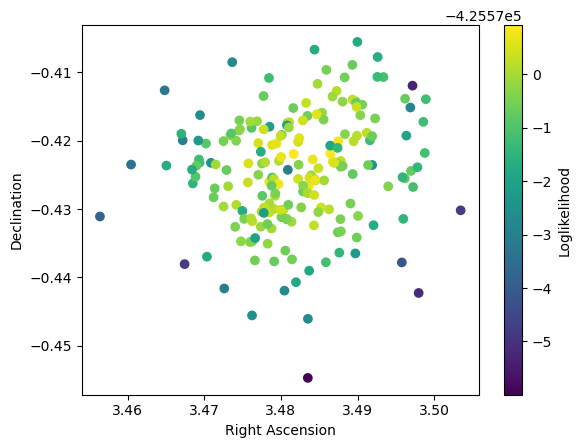

In [17]:
lik = mcmc_sampler_including_all_parameters.model_stats['loglikelihood']

pylab.scatter(ra_including_all_parameters[0, :, -1], dec_including_all_parameters[0, :, -1], c = lik[0, :, -1])
pylab.xlabel('Right Ascension')
pylab.ylabel('Declination')

c = pylab.colorbar()
c.set_label('Loglikelihood')

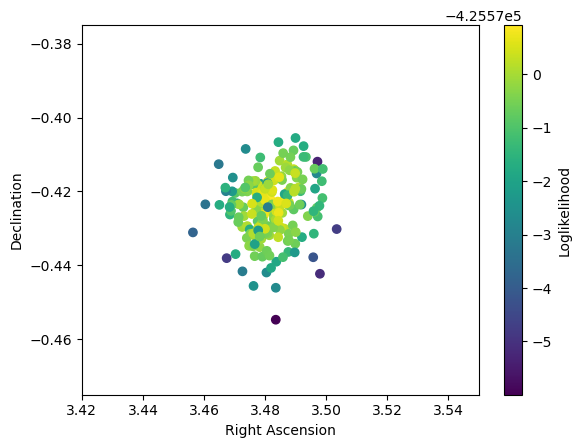

In [18]:
lik = mcmc_sampler_including_all_parameters.model_stats['loglikelihood']

pylab.scatter(ra_including_all_parameters[0, :, -1], dec_including_all_parameters[0, :, -1], c = lik[0, :, -1])
pylab.xlabel('Right Ascension')
pylab.ylabel('Declination')

c = pylab.colorbar()
c.set_label('Loglikelihood')

pylab.xlim(3.42, 3.55)
pylab.ylim(-0.475, -0.375)

pylab.show()

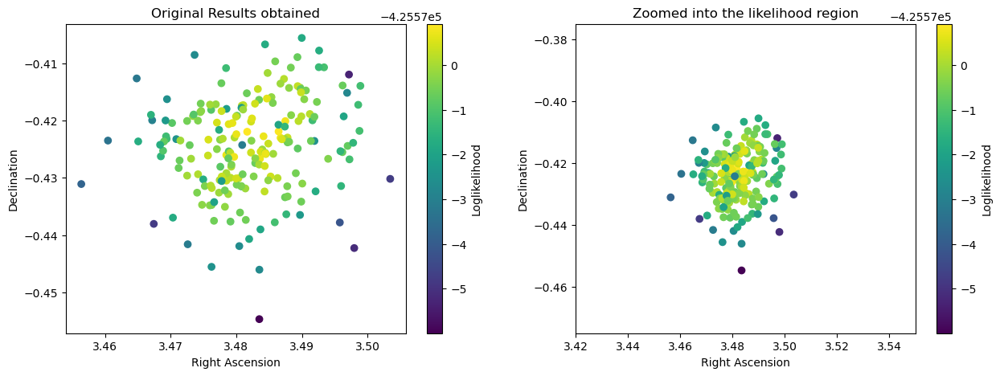

In [19]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
lik = mcmc_sampler_including_all_parameters.model_stats['loglikelihood']

pylab.scatter(ra_including_all_parameters[0, :, -1], dec_including_all_parameters[0, :, -1], c = lik[0, :, -1])
pylab.xlabel('Right Ascension')
pylab.ylabel('Declination')

pylab.title("Original Results obtained")
c = pylab.colorbar()
c.set_label('Loglikelihood')

plt.subplot(1, 2, 2)
lik = mcmc_sampler_including_all_parameters.model_stats['loglikelihood']

pylab.scatter(ra_including_all_parameters[0, :, -1], dec_including_all_parameters[0, :, -1], c = lik[0, :, -1])
pylab.xlabel('Right Ascension')
pylab.ylabel('Declination')

c = pylab.colorbar()
c.set_label('Loglikelihood')

pylab.title("Zoomed into the likelihood region")
pylab.xlim(3.42, 3.55)
pylab.ylim(-0.475, -0.375)

pylab.show()

#### Initial positions of the walkers for ra and dec

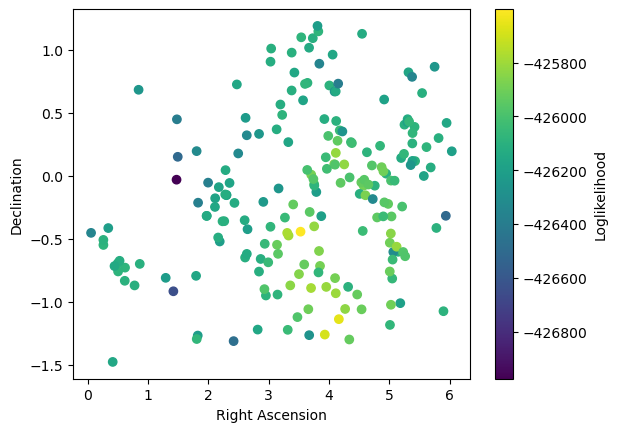

In [20]:
fig_ra_dec_including_all_parameters = plt.figure(1)

initial_ra_dec_including_all_parameters = pylab.scatter(ra_including_all_parameters[0, :, 0], 
                                                        dec_including_all_parameters[0, :, 0], 
                                                        c = lik[0, :, 0])
pylab.xlabel('Right Ascension')
pylab.ylabel('Declination')

c = pylab.colorbar()
c.set_label('Loglikelihood')

#### Convergence for ra and dec

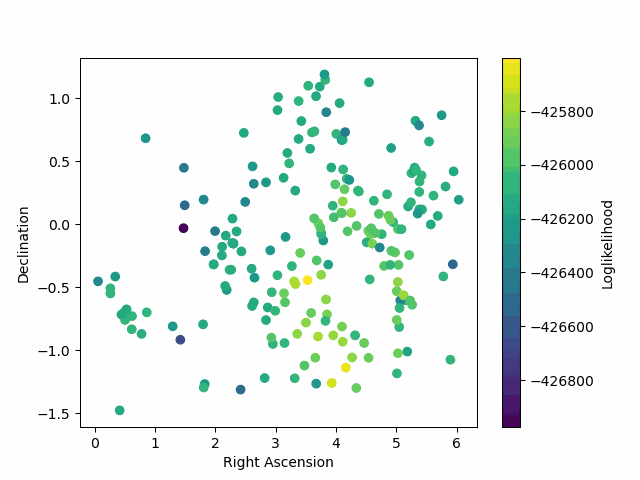

In [21]:
def animate(i):
    dat = np.array([ra_including_all_parameters[0, :, i], dec_including_all_parameters[0, :, i]])
    
    initial_ra_dec_including_all_parameters.set_offsets(dat.T)
    initial_ra_dec_including_all_parameters.set_array(lik[0, :, i])
    
    return (initial_ra_dec_including_all_parameters, )
    
nsamples_including_all_parameters = len(ra_including_all_parameters[0, 0, :])
ani = animation.FuncAnimation(fig_ra_dec_including_all_parameters, animate, frames = nsamples_including_all_parameters, interval = 200, blit = True)

ani.save('GW170817_ra_dec_all_parameters.gif', writer = PillowWriter(fps = 5))
with open('GW170817_ra_dec_all_parameters.gif','rb') as f:
    display(Image(data = f.read(), format = 'png'))

#### Convering to Posterior distribution of ra and dec

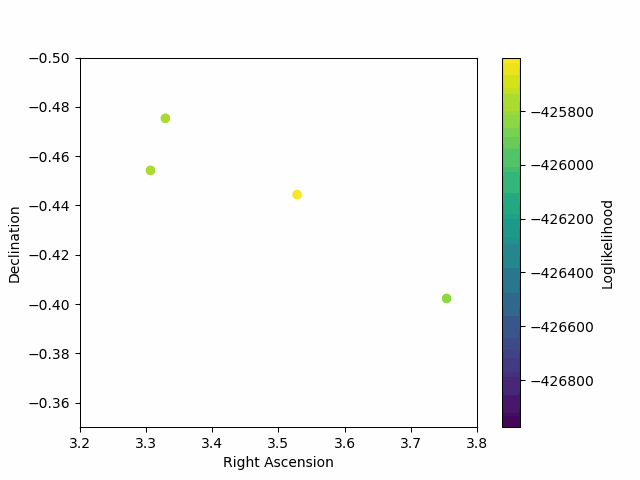

In [22]:
def animate(i):
    dat = np.array([ra_including_all_parameters[0, :, i], 
                    dec_including_all_parameters[0, :, i]])
    
    initial_ra_dec_including_all_parameters.set_offsets(dat.T)
    initial_ra_dec_including_all_parameters.set_array(lik[0, :, i])
    
    initial_ra_dec_including_all_parameters.axes.set_xlim(3.2, 3.8)
    initial_ra_dec_including_all_parameters.axes.set_ylim(-0.35, -0.5)
    
    return (initial_ra_dec_including_all_parameters, )
    
nsamples_including_all_parameters = len(ra_including_all_parameters[0, 0, :])


ani = animation.FuncAnimation(fig_ra_dec_including_all_parameters, animate, frames = nsamples_including_all_parameters, interval = 200, blit = True, )

ani.save('GW170817_ra_dec_all_parameters_zoomed.gif', writer = PillowWriter(fps = 5))

with open('GW170817_ra_dec_all_parameters_zoomed.gif','rb') as f:
    display(Image(data = f.read(), format = 'png'))

### Plots for "Distance" and "Inclination"

In [23]:
inclination_including_all_parameters = mcmc_sampler_including_all_parameters.samples['inclination']
distance_including_all_parameters = mcmc_sampler_including_all_parameters.samples['distance']

#### Posterior distribution of distance and dec

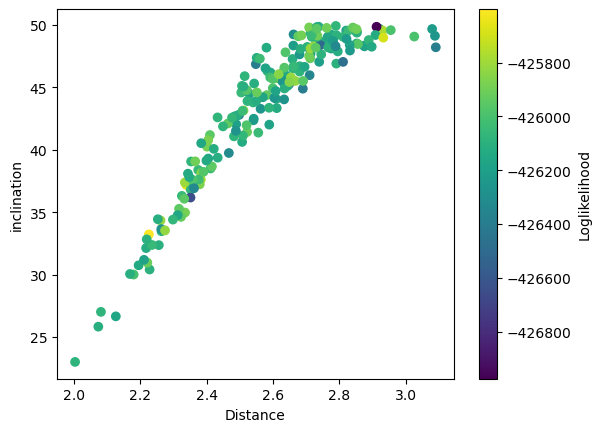

In [24]:
pylab.scatter(inclination_including_all_parameters[0, :, -1], 
                  distance_including_all_parameters[0, :, -1],
                  c=lik[0,:,0])

pylab.xlabel('Distance')
pylab.ylabel('inclination')

c = pylab.colorbar()

c.set_label('Loglikelihood')

#### Initial positions of the distance and inclination

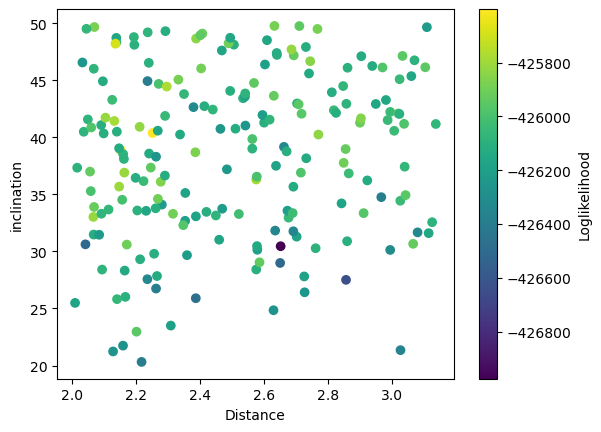

In [25]:
fig_dis_incl_including_all_parameters = plt.figure(3)

initial_dis_incl_including_all_parameters = pylab.scatter(inclination_including_all_parameters[0, :, 0], 
                  distance_including_all_parameters[0, :, 0],
                  c=lik[0,:,0])

pylab.xlabel('Distance')
pylab.ylabel('inclination')

c = pylab.colorbar()

c.set_label('Loglikelihood')

#### Convergence for distance and inclination

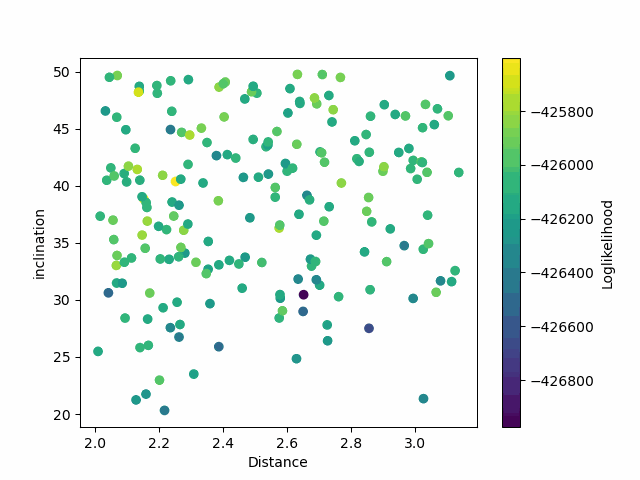

In [26]:
def animate(i):
    dat = np.array([inclination_including_all_parameters[0,:,i], 
                    distance_including_all_parameters[0,:,i]])
    
    initial_dis_incl_including_all_parameters.set_offsets(dat.T)
    initial_dis_incl_including_all_parameters.set_array(lik[0,:,i])
    return (initial_dis_incl_including_all_parameters, )
    
nsamples = len(distance_including_all_parameters[0,0,:])
ani = animation.FuncAnimation(fig_dis_incl_including_all_parameters, animate, frames = nsamples,
                              interval=200, blit=True)

ani.save('GW170817_inc_dist_all_parameters.gif', writer=PillowWriter(fps=5))
with open('GW170817_inc_dist_all_parameters.gif','rb') as f:
    display(Image(data=f.read(), format='png'))

#### Converging to posterior distribution zoomed

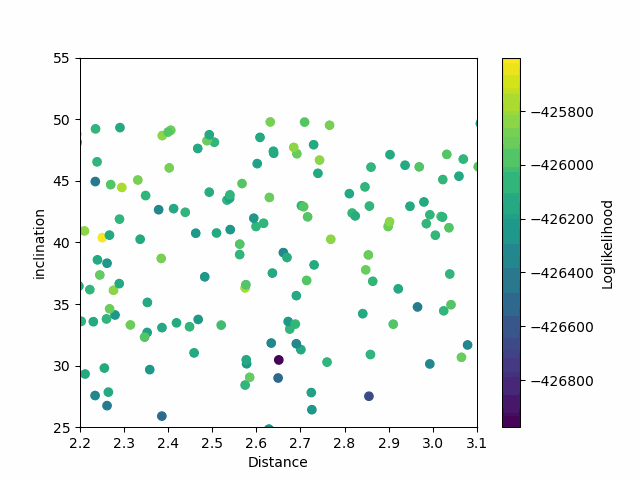

In [27]:
def animate(i):
    dat = np.array([inclination_including_all_parameters[0,:,i], 
                    distance_including_all_parameters[0,:,i]])
    
    initial_dis_incl_including_all_parameters.set_offsets(dat.T)
    initial_dis_incl_including_all_parameters.set_array(lik[0,:,i])
    
    initial_dis_incl_including_all_parameters.axes.set_xlim(2.2, 3.1)
    initial_dis_incl_including_all_parameters.axes.set_ylim(25, 55)
    
    return (initial_dis_incl_including_all_parameters, )
    
nsamples = len(distance_including_all_parameters[0,0,:])
ani = animation.FuncAnimation(fig_dis_incl_including_all_parameters, animate, frames = nsamples,
                              interval=200, blit=True)

ani.save('GW170817_inc_dist_all_parameters_zoomed.gif', writer=PillowWriter(fps=5))
with open('GW170817_inc_dist_all_parameters_zoomed.gif','rb') as f:
    display(Image(data=f.read(), format='png'))

### Density Plots

#### ra and dec

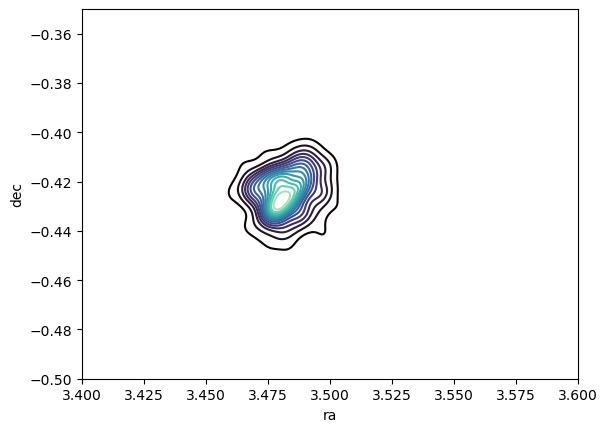

In [28]:
x = ra_including_all_parameters[0, :, -1]
y = dec_including_all_parameters[0, :, -1]

data = pd.DataFrame({'ra': x, 'dec': y})

sns.kdeplot(x = data['ra'], y = data['dec'], cmap = "mako", levels = 15)

pylab.xlim(3.40, 3.6)
pylab.ylim(-0.5, -0.35)
pylab.show()

#### inc and dist

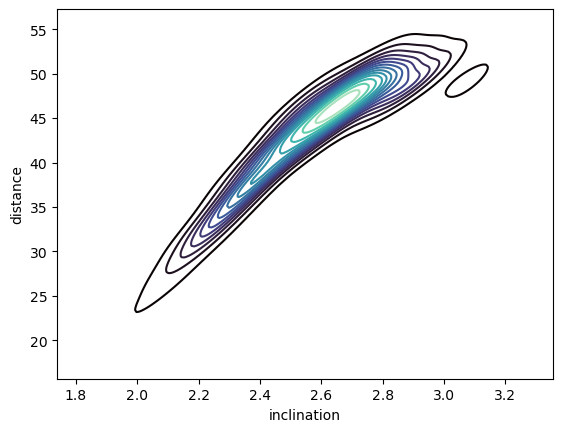

In [29]:
x = inclination_including_all_parameters[0, :, -1]
y = distance_including_all_parameters[0, :, -1]

data = pd.DataFrame({'inclination': x, 'distance': y})

sns.kdeplot(x=data['inclination'], y=data['distance'], cmap="mako", levels = 15)

pylab.show()

## Determining sky locations by making inclination = 0

In [30]:
static_parameters_incl_zero = {
    'mass1': 1.5210252,
    'mass2': 1.246091,
    'f_lower': 25.0,
    'tc': 1187008882.4282904,
    'approximant': 'TaylorF2',
    'polarization': 0,
    'inclination': 0
}

variable_parameters_incl_zero = (
    'distance',
    'ra',
    'dec'
)

# Prior distributions for the model
# Assigns a probability for each possible combination of values.
prior_incl_zero = JointDistribution(variable_parameters_incl_zero, Uniform(distance = (20, 50)), UniformSky())

### Setting up the model

In [31]:
model_incl_zero = models.SingleTemplate(variable_params = variable_parameters_incl_zero, data = copy.deepcopy(gw170817), 
                                        low_frequency_cutoff = {'H1': 25, 'L1': 25, 'V1': 25}, sample_rate = 8196, psds = psds, 
                                        static_params = static_parameters_incl_zero, prior = prior_incl_zero)

mcmc_sampler_incl_zero = sampler.EmceePTSampler(model = model_incl_zero, ntemps = 3, nwalkers = 200, nprocesses = 8)

###  Setting up the initial values

In [32]:
_ = mcmc_sampler_incl_zero.set_p0()

### Running the sampler

In [33]:
start_time_incl_zero = time.time()

mcmc_sampler_incl_zero.run_mcmc(niterations = 400)

end_time_incl_zero = time.time() - start_time_incl_zero

### Plots for "Right Ascension" and "Declination"

In [34]:
ra_incl_zero = mcmc_sampler_incl_zero.samples['ra']
dec_incl_zero = mcmc_sampler_incl_zero.samples['dec']

#### Posterior distribution of the ra and dec

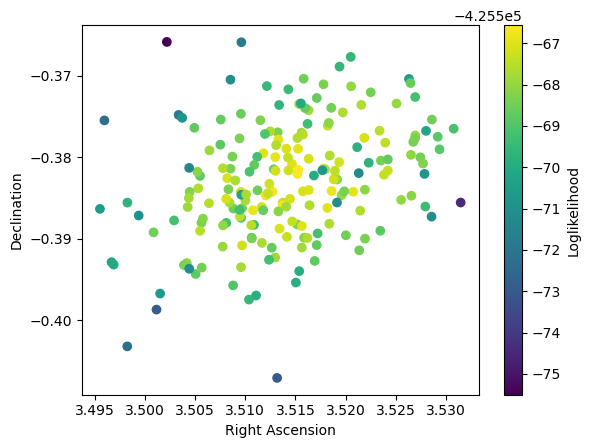

In [35]:
lik = mcmc_sampler_incl_zero.model_stats['loglikelihood']

pylab.scatter(ra_incl_zero[0, :, -1], dec_incl_zero[0, :, -1], c = lik[0,:,-1])
pylab.xlabel('Right Ascension')
pylab.ylabel('Declination')

c = pylab.colorbar()
c.set_label('Loglikelihood')

pylab.show()

#### Initial positions of the walkers for ra and dec

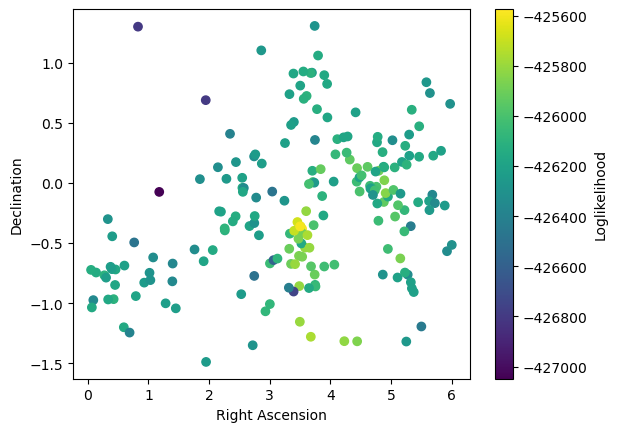

In [36]:
fig_ra_dec_incl_zero = plt.figure(4)

lik = mcmc_sampler_incl_zero.model_stats['loglikelihood']

initial_ra_dec_incl_zero_ = pylab.scatter(ra_incl_zero[0, :, 0], dec_incl_zero[0, :, 0], c = lik[0, :, 0])
pylab.xlabel('Right Ascension')
pylab.ylabel('Declination')

c = pylab.colorbar()
c.set_label('Loglikelihood')

pylab.show()

#### Convergence for ra and dec

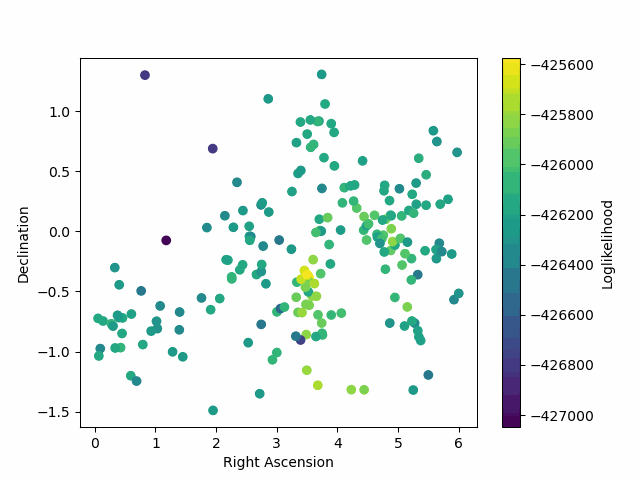

In [37]:
def animate(i):
    dat = np.array([ra_incl_zero[0, :, i], dec_incl_zero[0, :, i]])
    
    initial_ra_dec_incl_zero_.set_offsets(dat.T)
    initial_ra_dec_incl_zero_.set_array(lik[0, :, i])
    
    return (initial_ra_dec_incl_zero_, )

nsamples_incl_zero = len(ra_incl_zero[0, 0, :])
ani = animation.FuncAnimation(fig_ra_dec_incl_zero, animate, frames = nsamples_incl_zero, interval = 200, blit = True)

ani.save('GW170817_ra_dec_incl_zero.gif', writer = PillowWriter(fps = 5))
with open('GW170817_ra_dec_incl_zero.gif','rb') as f:
    display(Image(data = f.read(), format = 'png'))

#### Converging to posterior distribution zoomed

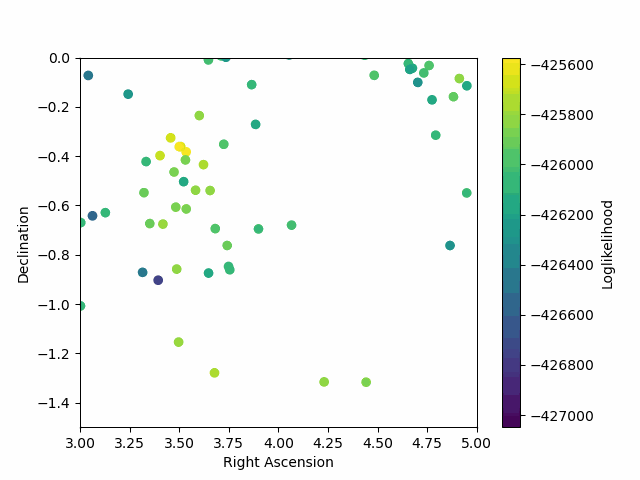

In [38]:
def animate(i):
    dat = np.array([ra_incl_zero[0, :, i], dec_incl_zero[0, :, i]])
    
    initial_ra_dec_incl_zero_.set_offsets(dat.T)
    initial_ra_dec_incl_zero_.set_array(lik[0, :, i])
    
    initial_ra_dec_incl_zero_.axes.set_xlim(3, 5)
    initial_ra_dec_incl_zero_.axes.set_ylim(-1.5, 0.0)
    
    return (initial_ra_dec_incl_zero_, )
    
nsamples_incl_zero = len(ra_incl_zero[0, 0, :])
ani = animation.FuncAnimation(fig_ra_dec_incl_zero, animate, frames = nsamples_incl_zero, interval = 200, blit = True)

ani.save('GW170817_incl_zero_zoomed.gif', writer = PillowWriter(fps = 5))
with open('GW170817_incl_zero_zoomed.gif','rb') as f:
    display(Image(data = f.read(), format = 'png'))

### Density Plot

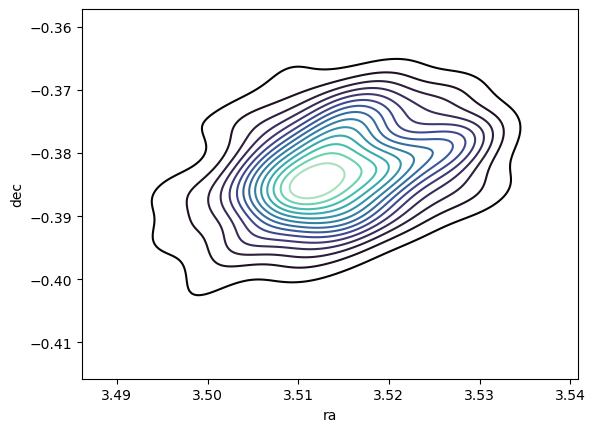

In [39]:
x = ra_incl_zero[0, :, -1]
y = dec_incl_zero[0, :, -1]

data = pd.DataFrame({'ra': x, 'dec': y})
sns.kdeplot(x=data['ra'], y=data['dec'], cmap="mako", levels = 15)

pylab.show()

# Posterior distribution of ra and dec (Including all parameters)

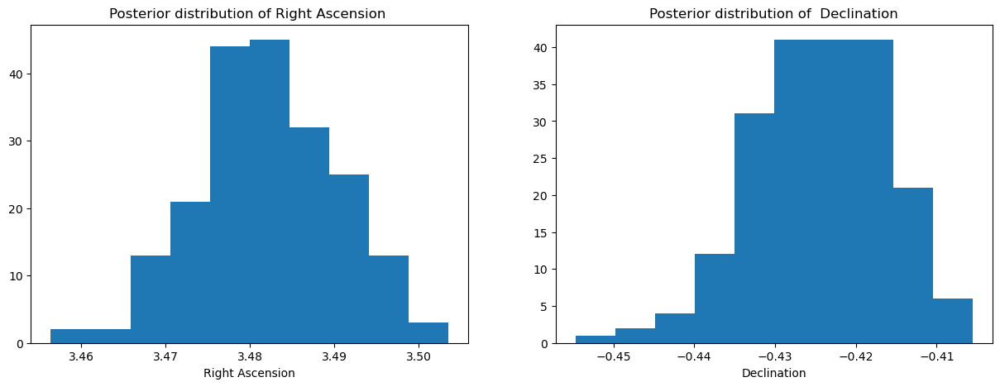

In [40]:
fig = pylab.figure(figsize = (15, 5))

fig = pylab.subplot(1, 2, 1)
pylab.hist(mcmc_sampler_including_all_parameters.samples['ra'][0, :, -1])
pylab.title("Posterior distribution of Right Ascension ")
pylab.xlabel("Right Ascension")

fig = pylab.subplot(1, 2, 2)
pylab.hist(mcmc_sampler_including_all_parameters.samples['dec'][0, :, -1])
pylab.title("Posterior distribution of  Declination")
pylab.xlabel("Declination")

pylab.show()

#### Plotting the distribution of ra and dec by removing the far points

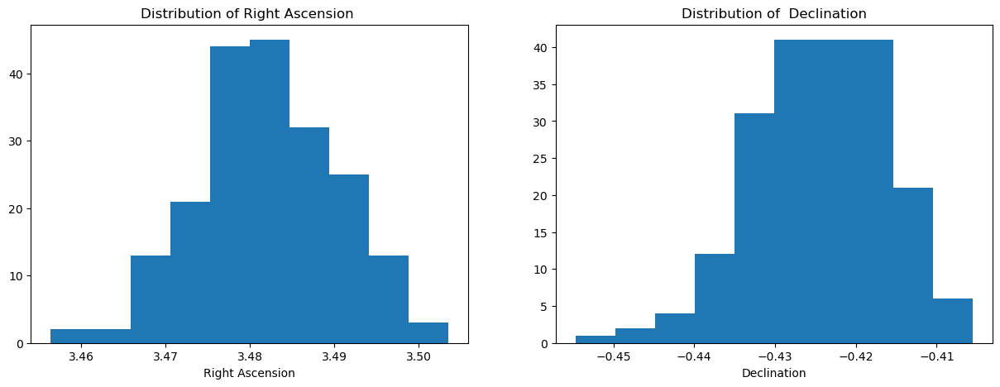

In [41]:
posterior_ra_including_all_parameters_filtering = mcmc_sampler_including_all_parameters.samples['ra'][0, :, -1]
posterior_dec_including_all_parameters_filtering = mcmc_sampler_including_all_parameters.samples['dec'][0, :, -1]

fig = pylab.figure(figsize = (15, 5))

fig = pylab.subplot(1, 2, 1)
pylab.hist(posterior_ra_including_all_parameters_filtering[posterior_ra_including_all_parameters_filtering < 4.1])
pylab.title("Distribution of Right Ascension ")
pylab.xlabel("Right Ascension")

fig = pylab.subplot(1, 2, 2)
pylab.hist(posterior_dec_including_all_parameters_filtering[posterior_dec_including_all_parameters_filtering > -1.0])
pylab.title("Distribution of  Declination")
pylab.xlabel("Declination")

pylab.show()

# Posterior distribution of ra and dec, inclination = 0

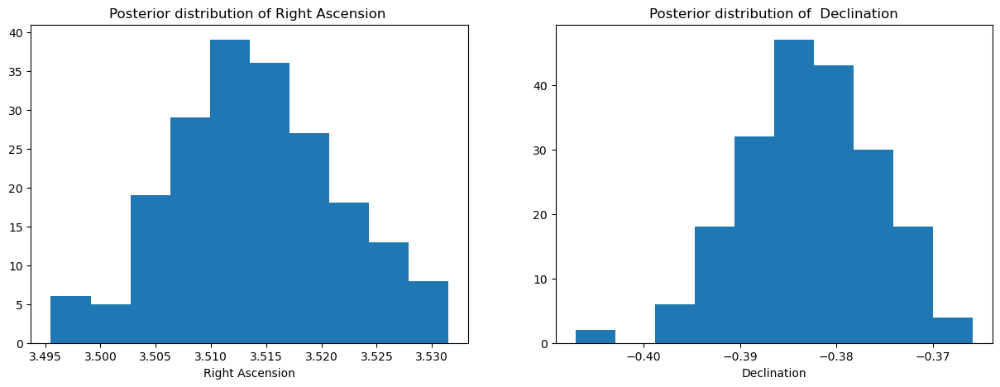

In [42]:
fig = pylab.figure(figsize = (15, 5))

fig = pylab.subplot(1, 2, 1)
pylab.hist(mcmc_sampler_incl_zero.samples['ra'][0, :, -1])
pylab.title("Posterior distribution of Right Ascension ")
pylab.xlabel("Right Ascension")

fig = pylab.subplot(1, 2, 2)
pylab.hist(mcmc_sampler_incl_zero.samples['dec'][0, :, -1])
pylab.title("Posterior distribution of  Declination")
pylab.xlabel("Declination")

pylab.show()

#  Determining sky locations using all parameters using PyCBC

In [43]:
start_time = time.time()

!pycbc_inference --verbose \
    --config-files model.ini data.ini prior_including_all_parameters.ini sampler_dynesty.ini \
    --output-file inference_including_all_parameters.hdf \
    --seed 28572013 \
    --nprocesses 8 \
    --force

end_time_including_all_parameters_pycbc = time.time() - start_time

2023-05-01T00:42:43.527-04:00 Using seed 28572013
2023-05-01T00:42:43.528-04:00 Running with CPU support: 1 threads
2023-05-01T00:42:43.592-04:00 Reading configuration file
2023-05-01T00:42:43.593-04:00 Setting up model
2023-05-01T00:42:43.595-04:00 Setting up priors for each parameter
2023-05-01T00:42:43.596-04:00 No sampling_params section read from config file
2023-05-01T00:42:43.598-04:00 Determining analysis times to use
2023-05-01T00:42:43.598-04:00 Padding H1 analysis start and end times by 2 (= psd-inverse-length/2) seconds to account for PSD wrap around effects.
2023-05-01T00:42:43.598-04:00 Padding L1 analysis start and end times by 2 (= psd-inverse-length/2) seconds to account for PSD wrap around effects.
2023-05-01T00:42:43.598-04:00 Padding V1 analysis start and end times by 2 (= psd-inverse-length/2) seconds to account for PSD wrap around effects.
2023-05-01T00:42:43.599-04:00 Reading Frames
2023-05-01T00:42:48.891-04:00 Highpass Filtering
2023-05-01T00:42:48.948-04:00 Re

**Running a python script called "pycbc_inference" with a set of configuration files and options.**

In [44]:
!pycbc_inference_plot_posterior --input-file inference_including_all_parameters.hdf \
    --output-file posterior_including_all_parameters.png \
    --plot-marginal --plot-contours \
    --plot-density --max-kde-samples 5000 --verbose

2023-05-01T00:47:31.770-04:00 Reading input file inference_including_all_parameters.hdf
2023-05-01T00:47:31.771-04:00 Loading samples
2023-05-01T00:47:31.786-04:00 Loaded 17421 samples
2023-05-01T00:47:31.786-04:00 Plotting
2023-05-01T00:47:40.280-04:00 Done


**To visualise the posterior distribution of sky locations: ra, dec, distance and inclination.<br>Input: inference_including_all_parameters.hdf<br>Output: posterior_including_all_parameters.png**

In [45]:
!pycbc_inference_create_fits --input-file inference_including_all_parameters.hdf \
    --output-file skypost_including_all_parameters.fits --maxpts 1000

2023-05-01 00:47:43,695 INFO reading samples
2023-05-01 00:47:43,874 INFO taking random subsample of chain
2023-05-01 00:47:43,885 INFO clustering ...
100%|█████████████████████████████████████████| 200/200 [00:30<00:00,  6.66it/s]
2023-05-01 00:48:13,922 INFO clustering ...
100%|█████████████████████████████████████████| 200/200 [00:14<00:00, 14.21it/s]
2023-05-01 00:48:27,994 INFO pickling
2023-05-01 00:48:27,995 INFO making skymap
adaptive refinement round 1 of 7 ...
adaptive refinement round 2 of 7 ...
adaptive refinement round 3 of 7 ...
adaptive refinement round 4 of 7 ...
adaptive refinement round 5 of 7 ...
adaptive refinement round 6 of 7 ...
adaptive refinement round 7 of 7 ...
evaluating distance layers ...
100%|███████████████████████████████████| 16896/16896 [00:06<00:00, 2512.92it/s]


**The FITS file is used for further visualisation of the posterior distribution of the sky locations parameters: ra and dec**

In [46]:
!pycbc_inference_plot_skymap --input-file skypost_including_all_parameters.fits \
    --output-file skymap_including_all_parameters.png

**To create a sky map of posterior probability density for the sky locations ra and dec**

#  Determining sky locations by making inclination = 0 using PyCBC

In [47]:
start_time = time.time()

!pycbc_inference --verbose \
    --config-files model.ini data.ini prior_incl_zero.ini sampler_dynesty.ini \
    --output-file inference_incl_zero.hdf \
    --seed 28572013 \
    --nprocesses 8 \
    --force

end_time_incl_zero_pycbc = time.time() - start_time

2023-05-01T00:48:43.278-04:00 Using seed 28572013
2023-05-01T00:48:43.278-04:00 Running with CPU support: 1 threads
2023-05-01T00:48:43.404-04:00 Reading configuration file
2023-05-01T00:48:43.408-04:00 Setting up model
2023-05-01T00:48:43.409-04:00 Setting up priors for each parameter
2023-05-01T00:48:43.410-04:00 No sampling_params section read from config file
2023-05-01T00:48:43.412-04:00 Determining analysis times to use
2023-05-01T00:48:43.412-04:00 Padding H1 analysis start and end times by 2 (= psd-inverse-length/2) seconds to account for PSD wrap around effects.
2023-05-01T00:48:43.412-04:00 Padding L1 analysis start and end times by 2 (= psd-inverse-length/2) seconds to account for PSD wrap around effects.
2023-05-01T00:48:43.412-04:00 Padding V1 analysis start and end times by 2 (= psd-inverse-length/2) seconds to account for PSD wrap around effects.
2023-05-01T00:48:43.412-04:00 Reading Frames
2023-05-01T00:48:48.747-04:00 Highpass Filtering
2023-05-01T00:48:48.808-04:00 Re

**Running a python script called "pycbc_inference" with a set of configuration files and options.**

In [48]:
!pycbc_inference_plot_posterior --input-file inference_incl_zero.hdf \
    --output-file posterior_incl_zero.png \
    --plot-marginal --plot-contours \
    --plot-density --max-kde-samples 5000 --verbose

2023-05-01T00:50:14.164-04:00 Reading input file inference_incl_zero.hdf
2023-05-01T00:50:14.166-04:00 Loading samples
2023-05-01T00:50:14.180-04:00 Loaded 17563 samples
2023-05-01T00:50:14.181-04:00 Plotting
2023-05-01T00:50:18.386-04:00 Done


**To visualise the posterior distribution of sky locations: ra, dec, distance and inclination.<br>
Input: inference_including_all_parameters.hdf<br>
Output: posterior_including_all_parameters.png<br>**

In [49]:
!pycbc_inference_create_fits --input-file inference_incl_zero.hdf \
    --output-file skypost_incl_zero.fits --maxpts 1000

2023-05-01 00:50:21,720 INFO reading samples
2023-05-01 00:50:21,894 INFO taking random subsample of chain
2023-05-01 00:50:21,905 INFO clustering ...
100%|█████████████████████████████████████████| 200/200 [00:29<00:00,  6.72it/s]
2023-05-01 00:50:51,657 INFO clustering ...
100%|█████████████████████████████████████████| 200/200 [00:14<00:00, 13.74it/s]
2023-05-01 00:51:06,212 INFO pickling
2023-05-01 00:51:06,213 INFO making skymap
adaptive refinement round 1 of 7 ...
adaptive refinement round 2 of 7 ...
adaptive refinement round 3 of 7 ...
adaptive refinement round 4 of 7 ...
adaptive refinement round 5 of 7 ...
adaptive refinement round 6 of 7 ...
adaptive refinement round 7 of 7 ...
evaluating distance layers ...
100%|███████████████████████████████████| 16896/16896 [00:04<00:00, 4178.71it/s]


**The FITS file is used for further visualisation of the posterior distribution of the sky locations parameters: ra and dec**

In [50]:
!pycbc_inference_plot_skymap --input-file skypost_incl_zero.fits \
    --output-file skymap_incl_zero.png

**To create a sky map of posterior probability density for the sky locations ra and dec**

# Timings

In [51]:
results_dict = {
    'sampler_name': ['PT Sampler', 'PT Sampler', 'Nested Sampler', 'Nested Sampler'],
    'parameters': ['All', 'Partial', 'All', 'Partial'],
    'time': [end_time_including_all_parameters, end_time_incl_zero, end_time_including_all_parameters_pycbc, end_time_incl_zero_pycbc],
    'ra': [np.mean(ra_including_all_parameters[0, :, -1]), np.mean(ra_incl_zero[0, :, -1]), 3.498, 3.504],
    'dec': [np.mean(dec_including_all_parameters[0, :, -1]), np.mean(dec_incl_zero[0, :, -1]), -0.366, -0.359]
}

In [52]:
pd.DataFrame(results_dict)

,sampler_name,parameters,time,ra,dec
0,PT Sampler,All,346.883268,3.482089,-0.424477
1,PT Sampler,Partial,362.703101,3.514163,-0.383027
2,Nested Sampler,All,285.859406,3.498000,-0.366000
3,Nested Sampler,Partial,90.079029,3.504000,-0.359000
